In [ ]:
! wget "https://sid.erda.dk/public/archives/ff17dc924eba88d5d01a807357d6614c/FullIJCNN2013.zip"
! unzip "FullIJCNN2013.zip"

In [2]:
! cat "FullIJCNN2013/readme.txt"

cat: FullIJCNN2013/readme.txt: No such file or directory


In [4]:
import os

test_base_path = "/kaggle/input/german-traffic-sign-detection-gtsdb-dataset/GTSDB_Train_and_Test/Test"
train_base_path = "/kaggle/input/german-traffic-sign-detection-gtsdb-dataset/GTSDB_Train_and_Test/Train"

train_img_path = os.path.join(train_base_path, "images")
train_label_path = os.path.join(train_base_path, "labels")

In [5]:
from PIL import Image
import os
import random

files = [f for f in os.listdir(train_img_path) if os.path.isfile(os.path.join(train_img_path, f))]

# choose a random file
if files:
    random_sample = random.choice(files)

img = Image.open(os.path.join(train_img_path, random_sample))


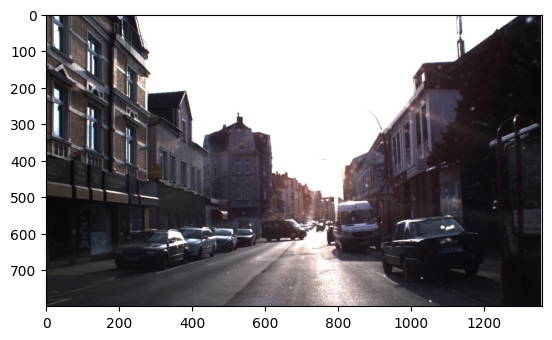

In [6]:
import matplotlib.pyplot as plt
plt.imshow(img)
plt.show()

In [40]:
import yaml

dataset_info = {
    'path': '/kaggle/input/german-traffic-sign-detection-gtsdb-dataset/GTSDB_Train_and_Test/',
    'train': 'Train/images',
    'val': 'Test/images',
    'nc': 43,
    'names': {
        0: 'speed limit 20 (prohibitory)',
        1: 'speed limit 30 (prohibitory)',
        2: 'speed limit 50 (prohibitory)',
        3: 'speed limit 60 (prohibitory)',
        4: 'speed limit 70 (prohibitory)',
        5: 'speed limit 80 (prohibitory)',
        6: 'restriction ends 80 (other)',
        7: 'speed limit 100 (prohibitory)',
        8: 'speed limit 120 (prohibitory)',
        9: 'no overtaking (prohibitory)',
        10: 'no overtaking (trucks) (prohibitory)',
        11: 'priority at next intersection (danger)',
        12: 'priority road (other)',
        13: 'give way (other)',
        14: 'stop (other)',
        15: 'no traffic both ways (prohibitory)',
        16: 'no trucks (prohibitory)',
        17: 'no entry (other)',
        18: 'danger (danger)',
        19: 'bend left (danger)',
        20: 'bend right (danger)',
        21: 'bend (danger)',
        22: 'uneven road (danger)',
        23: 'slippery road (danger)',
        24: 'road narrows (danger)',
        25: 'construction (danger)',
        26: 'traffic signal (danger)',
        27: 'pedestrian crossing (danger)',
        28: 'school crossing (danger)',
        29: 'cycles crossing (danger)',
        30: 'snow (danger)',
        31: 'animals (danger)',
        32: 'restriction ends (other)',
        33: 'go right (mandatory)',
        34: 'go left (mandatory)',
        35: 'go straight (mandatory)',
        36: 'go right or straight (mandatory)',
        37: 'go left or straight (mandatory)',
        38: 'keep right (mandatory)',
        39: 'keep left (mandatory)',
        40: 'roundabout (mandatory)',
        41: 'restriction ends (overtaking) (other)',
        42: 'restriction ends (overtaking (trucks)) (other)',
    }
}

with open('dataset.yaml', 'w') as f:
    yaml.dump(dataset_info, f, sort_keys=False)


In [41]:
! cat dataset.yaml

path: /kaggle/input/german-traffic-sign-detection-gtsdb-dataset/GTSDB_Train_and_Test/
train: Train/images
val: Test/images
nc: 43
names:
  0: speed limit 20 (prohibitory)
  1: speed limit 30 (prohibitory)
  2: speed limit 50 (prohibitory)
  3: speed limit 60 (prohibitory)
  4: speed limit 70 (prohibitory)
  5: speed limit 80 (prohibitory)
  6: restriction ends 80 (other)
  7: speed limit 100 (prohibitory)
  8: speed limit 120 (prohibitory)
  9: no overtaking (prohibitory)
  10: no overtaking (trucks) (prohibitory)
  11: priority at next intersection (danger)
  12: priority road (other)
  13: give way (other)
  14: stop (other)
  15: no traffic both ways (prohibitory)
  16: no trucks (prohibitory)
  17: no entry (other)
  18: danger (danger)
  19: bend left (danger)
  20: bend right (danger)
  21: bend (danger)
  22: uneven road (danger)
  23: slippery road (danger)
  24: road narrows (danger)
  25: construction (danger)
  26: traffic signal (danger)
  27: pedestrian crossing (danger)
 

In [10]:
! pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 19.0 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 65.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 59.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 49.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 30.0 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 10.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 59.7 MB/s eta 0:00:00:00:0100:01
  Attempting unins

In [42]:
import torch

# Clear cache
torch.cuda.empty_cache()

# Optional: Collect unused memory from Python garbage collector
import gc
gc.collect()

# If using newer PyTorch and CUDA version:
torch.cuda.ipc_collect()

In [51]:
from ultralytics import YOLO
model = YOLO("yolo11x.pt")

# because of a wrong redefinition of the models classification head
# because of of the already pretrained model
# add the nc to the dataset.yaml

results = model.train(data="dataset.yaml", batch=16, epochs=100, imgsz=640, device=[0, 1])

Ultralytics 8.3.170 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
                                                        CUDA:1 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=dataset.yaml, degrees=0.0, deterministic=True, device=0,1, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11x.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=T

train: Scanning /kaggle/input/german-traffic-sign-detection-gtsdb-dataset/GTSDB_Train_and_Test/Train/labels... 506 images, 94 backgrounds, 0 corrupt: 100%|██████████| 600/600 [00:00<00:00, 1087.73it/s]


WARNING ⚠️ train: Cache directory /kaggle/input/german-traffic-sign-detection-gtsdb-dataset/GTSDB_Train_and_Test/Train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


train: Scanning /kaggle/input/german-traffic-sign-detection-gtsdb-dataset/GTSDB_Train_and_Test/Train/labels... 210 images, 3 backgrounds, 0 corrupt:  36%|███▌      | 213/600 [00:00<00:00, 1061.75it/s]

val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 245.8±74.0 MB/s, size: 153.9 KB)


train: Scanning /kaggle/input/german-traffic-sign-detection-gtsdb-dataset/GTSDB_Train_and_Test/Train/labels... 506 images, 94 backgrounds, 0 corrupt: 100%|██████████| 600/600 [00:00<00:00, 1016.71it/s]
val: Scanning /kaggle/input/german-traffic-sign-detection-gtsdb-dataset/GTSDB_Train_and_Test/Test/labels... 235 images, 65 backgrounds, 1 corrupt: 100%|██████████| 300/300 [00:00<00:00, 793.24it/s]


val: /kaggle/input/german-traffic-sign-detection-gtsdb-dataset/GTSDB_Train_and_Test/Test/images/00862.jpg: ignoring corrupt image/label: Label class 100 exceeds dataset class count 43. Possible class labels are 0-42
WARNING ⚠️ val: Cache directory /kaggle/input/german-traffic-sign-detection-gtsdb-dataset/GTSDB_Train_and_Test/Test is not writeable, cache not saved.
Plotting labels to runs/detect/train4/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000213, momentum=0.9) with parameter groups 167 weight(decay=0.0), 174 weight(decay=0.0005), 173 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/detect/train4
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      8.21G     0.9939      6.867     0.8891          7        640: 100%|██████████| 38/38 [00:30<00:00,  1.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.77it/s]


                   all        299        360     0.0124      0.299     0.0235     0.0188

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      8.98G     0.8731       4.21     0.8004          9        640: 100%|██████████| 38/38 [00:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360     0.0178      0.495     0.0471     0.0375

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      8.99G     0.8461      3.042       0.83          5        640: 100%|██████████| 38/38 [00:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.79it/s]


                   all        299        360     0.0148      0.168     0.0189     0.0151

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100         9G     0.8406      2.655     0.8306          5        640: 100%|██████████| 38/38 [00:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.94it/s]


                   all        299        360      0.238     0.0941     0.0339     0.0248

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      8.97G     0.8375       2.24     0.8377          5        640: 100%|██████████| 38/38 [00:27<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.94it/s]


                   all        299        360     0.0122      0.112     0.0219     0.0164

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100         9G     0.8713      2.038     0.8296          6        640: 100%|██████████| 38/38 [00:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.92it/s]


                   all        299        360      0.016      0.314     0.0414     0.0317

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      8.97G     0.7821      1.805     0.8212          4        640: 100%|██████████| 38/38 [00:27<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.93it/s]


                   all        299        360      0.253     0.0784     0.0391     0.0334

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      9.01G     0.7322      1.656     0.8082          7        640: 100%|██████████| 38/38 [00:27<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.92it/s]


                   all        299        360     0.0133      0.253     0.0321     0.0261

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      8.97G     0.8182      1.796     0.8275          7        640: 100%|██████████| 38/38 [00:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.92it/s]


                   all        299        360      0.178     0.0502     0.0349     0.0288

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      8.99G     0.7978      1.604      0.809          6        640: 100%|██████████| 38/38 [00:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.93it/s]


                   all        299        360     0.0167      0.393     0.0411      0.034

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      8.98G     0.7163      1.377      0.826          3        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.93it/s]


                   all        299        360      0.602     0.0207     0.0403     0.0317

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      9.01G     0.7232      1.447     0.8156          7        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.94it/s]


                   all        299        360     0.0222      0.322     0.0511     0.0426

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      8.96G     0.6894      1.339     0.8091          5        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        299        360      0.128      0.101     0.0421     0.0351

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      9.01G      0.664       1.19     0.7993          3        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        299        360     0.0182       0.25     0.0418      0.035

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      8.97G     0.7166      1.315     0.8312          4        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        299        360      0.214      0.056     0.0472     0.0411

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100         9G     0.7381       1.34     0.8175          8        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360     0.0195      0.282     0.0455     0.0378

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      8.98G     0.7033      1.161     0.8017          7        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        299        360     0.0165      0.295     0.0394      0.033

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      9.01G     0.6441      1.031     0.8071          5        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        299        360     0.0181      0.318     0.0478     0.0396

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      8.97G     0.6472      1.002      0.789          3        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360     0.0175      0.247     0.0477       0.04

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      9.01G     0.6486     0.9887     0.8005          7        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.96it/s]


                   all        299        360      0.202      0.026     0.0369     0.0312

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      8.98G     0.6955      1.014     0.8105          7        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360     0.0172      0.233     0.0412     0.0346

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100         9G     0.6734     0.9807      0.815          6        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.94it/s]


                   all        299        360      0.361     0.0245      0.032      0.026

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      8.97G     0.7066     0.9434     0.8119          7        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.96it/s]


                   all        299        360      0.011      0.208     0.0314     0.0272

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      9.01G     0.6398     0.8956     0.8072         13        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        299        360     0.0218      0.205     0.0403     0.0338

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      8.98G     0.6482     0.8655     0.8001          7        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        299        360     0.0197      0.195     0.0405     0.0348

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100         9G     0.6829     0.8926        0.8          1        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.96it/s]


                   all        299        360     0.0203      0.181     0.0356      0.031

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      8.97G     0.6727     0.8647     0.7969         13        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360     0.0205      0.174     0.0369     0.0309

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      9.01G     0.6304     0.8539     0.7955          6        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        299        360     0.0191      0.219     0.0371     0.0317

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      8.98G     0.6277     0.8677      0.803          7        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360       0.02      0.202       0.04     0.0335

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      9.01G     0.6362     0.8447     0.7933          2        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360        0.6     0.0204     0.0377     0.0311

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      8.98G     0.6276     0.7248     0.7926          6        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.99it/s]


                   all        299        360      0.242     0.0388     0.0415      0.035

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100         9G     0.6266     0.7408     0.7989         11        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        299        360      0.183     0.0345     0.0352     0.0294

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      8.98G     0.5735     0.6408     0.8277          5        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360      0.105     0.0258     0.0339     0.0294

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      9.01G     0.6227     0.7995     0.7975          7        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        299        360     0.0163      0.157     0.0341      0.029

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      8.98G     0.6157     0.6629     0.7986          2        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360     0.0204      0.143     0.0334     0.0284

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      9.01G     0.5897     0.6049     0.8002          5        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        299        360      0.154     0.0326     0.0327     0.0274

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      8.97G     0.6097     0.6828     0.7829          5        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        299        360     0.0194      0.113      0.032     0.0267

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      9.01G     0.5808     0.6241     0.7932          9        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.99it/s]


                   all        299        360      0.418     0.0221     0.0306     0.0245

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      8.98G     0.5941     0.6026     0.8001          5        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        299        360     0.0132      0.105     0.0301     0.0261

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      9.02G     0.5696     0.5685     0.7856          8        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.96it/s]


                   all        299        360      0.101     0.0306     0.0321     0.0276

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      8.98G     0.5682     0.5188     0.7994          5        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360      0.311     0.0245     0.0363     0.0318

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      9.01G     0.6022     0.6024     0.8018          6        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360     0.0241      0.131     0.0407     0.0357

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      8.97G     0.5498     0.5509     0.7861          6        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.96it/s]


                   all        299        360      0.018      0.121     0.0348     0.0292

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      9.01G     0.5773     0.5628     0.7844          6        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.99it/s]


                   all        299        360     0.0227      0.123     0.0356     0.0315

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      8.98G     0.5402      0.555     0.8052          6        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360     0.0233      0.105     0.0372     0.0323

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100         9G     0.5426     0.5266     0.7915          3        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360     0.0159     0.0959     0.0311     0.0268

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      8.97G     0.5454     0.5151     0.7871          8        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.96it/s]


                   all        299        360      0.165     0.0295     0.0341     0.0289

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      9.01G     0.5125     0.4618      0.792          7        640: 100%|██████████| 38/38 [00:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  3.00it/s]


                   all        299        360     0.0207      0.103     0.0371     0.0316

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      8.97G     0.5028     0.4491     0.7851          4        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        299        360      0.126     0.0212     0.0272     0.0237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      9.01G     0.5194     0.4695     0.7904          9        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.96it/s]


                   all        299        360     0.0169     0.0936     0.0313      0.028

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      8.97G       0.54     0.4436     0.7952          5        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.96it/s]


                   all        299        360       0.36     0.0221     0.0297     0.0257

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      9.02G     0.5299     0.4571     0.7894          5        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360     0.0139     0.0845     0.0268     0.0228

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      8.98G     0.4879     0.4566     0.7894          4        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        299        360      0.314     0.0228     0.0275     0.0232

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      9.01G     0.5169     0.4332     0.7829          4        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        299        360     0.0193      0.109     0.0352       0.03

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      8.99G     0.5033     0.4424      0.798          6        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.96it/s]


                   all        299        360      0.151      0.031     0.0277     0.0237

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      9.01G     0.4938      0.447     0.7854          8        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        299        360     0.0181      0.111     0.0338     0.0295

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      8.96G      0.498     0.4323     0.7786          3        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360      0.019     0.0886     0.0319     0.0282

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100         9G     0.4885     0.4355     0.7829          6        640: 100%|██████████| 38/38 [00:28<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.94it/s]


                   all        299        360     0.0147     0.0883     0.0321     0.0285

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      8.98G     0.4721     0.3935      0.787          5        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.96it/s]


                   all        299        360      0.175     0.0269     0.0316     0.0279

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      9.01G     0.5158     0.3897     0.8001          4        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        299        360     0.0147     0.0946     0.0304     0.0254

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      8.98G     0.4934      0.419     0.7925          4        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.96it/s]


                   all        299        360     0.0169     0.0842     0.0292     0.0258

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100         9G     0.5096       0.44     0.7883          2        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.95it/s]


                   all        299        360      0.363     0.0204     0.0287     0.0252

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      8.97G     0.4699     0.3854     0.7702         10        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  3.01it/s]


                   all        299        360       0.26     0.0239     0.0292     0.0256

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      9.01G     0.4791     0.4222     0.7844          6        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.99it/s]


                   all        299        360       0.42     0.0234     0.0297     0.0259

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      8.98G      0.491      0.378      0.783          2        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360      0.015     0.0737     0.0273     0.0243

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      9.01G     0.4617     0.3792     0.7743          4        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360      0.233     0.0253     0.0287     0.0254

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      8.97G     0.4601     0.3456     0.7873          4        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360       0.26     0.0241     0.0269     0.0235

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100         9G     0.4322     0.3366      0.777          4        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.99it/s]


                   all        299        360      0.205     0.0224     0.0251     0.0218

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      8.97G      0.454     0.3453     0.7812          8        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360      0.203     0.0284     0.0263     0.0228

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      9.01G     0.4582     0.3509     0.7783          7        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.99it/s]


                   all        299        360      0.256     0.0259     0.0267     0.0231

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      8.96G     0.4813     0.3524     0.7801          2        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360      0.285     0.0224     0.0282     0.0242

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      9.01G     0.4745     0.3557     0.7625          7        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360     0.0141     0.0876     0.0291     0.0252

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      8.98G     0.4409      0.352     0.7815          6        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.96it/s]


                   all        299        360     0.0198     0.0987     0.0336     0.0294

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      9.01G     0.4859     0.3783      0.798          2        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360     0.0192     0.0937     0.0326     0.0284

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      8.98G     0.4497     0.3201      0.779         10        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360     0.0169     0.0881     0.0303     0.0265

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      8.99G      0.428     0.3226     0.7747          3        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360     0.0192     0.0866     0.0294     0.0254

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      8.98G      0.396     0.3056     0.7694          6        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360     0.0198     0.0601     0.0306     0.0267

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      9.01G     0.4146     0.3476      0.808          6        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360      0.257     0.0278     0.0272     0.0238

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      8.97G     0.3956     0.3074     0.7803          6        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.96it/s]


                   all        299        360      0.016      0.091     0.0298      0.026

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100         9G      0.414     0.3119     0.7795          8        640: 100%|██████████| 38/38 [00:28<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360     0.0168     0.0987     0.0301     0.0262

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      8.99G     0.4108     0.3232     0.7824          3        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360      0.204     0.0279     0.0282     0.0245

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      9.01G     0.3904     0.3082     0.7692          7        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360     0.0228     0.0543      0.033      0.029

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      8.98G     0.3862     0.2931      0.776          5        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360     0.0241     0.0906      0.034       0.03

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100         9G      0.383     0.2973     0.7866          9        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.96it/s]


                   all        299        360     0.0703     0.0369      0.029     0.0253

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      8.97G     0.3845     0.2829     0.7781          1        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360      0.259     0.0243     0.0283     0.0248

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      9.01G     0.3841     0.2851     0.7838          6        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360     0.0174     0.0841     0.0294      0.026

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      8.98G     0.4106     0.2841     0.7754          4        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360     0.0259     0.0989     0.0343     0.0303

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      9.02G       0.37     0.2998     0.7883          8        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360      0.019     0.0943     0.0309     0.0273

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      8.97G     0.3734     0.2843     0.7683          5        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.99it/s]


                   all        299        360      0.016     0.0833      0.029     0.0253

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100         9G     0.3659      0.272     0.7817          6        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360      0.026     0.0894     0.0345     0.0305
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      8.98G     0.3849     0.2744     0.7867          3        640: 100%|██████████| 38/38 [00:28<00:00,  1.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.97it/s]


                   all        299        360     0.0142     0.0831     0.0281     0.0244

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      9.01G     0.3434     0.2478      0.765          3        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.96it/s]


                   all        299        360     0.0154     0.0899     0.0286      0.025

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      8.98G     0.3515     0.2594     0.7724          4        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360     0.0169      0.088     0.0292     0.0253

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      9.01G     0.3496      0.269     0.7735          4        640: 100%|██████████| 38/38 [00:27<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360     0.0195     0.0922     0.0303     0.0266

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      8.98G     0.3535      0.255     0.7732          4        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360     0.0173       0.09     0.0282     0.0245

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      9.01G     0.3494     0.2535     0.7684          4        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.99it/s]


                   all        299        360     0.0203     0.0922     0.0305     0.0263

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      8.98G     0.3491     0.2497     0.7722          3        640: 100%|██████████| 38/38 [00:27<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360     0.0195     0.0929     0.0304     0.0266

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100         9G     0.3457     0.2449     0.7717          2        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360     0.0185     0.0929       0.03     0.0261

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      8.96G     0.3509     0.2379     0.7664          4        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  2.98it/s]


                   all        299        360     0.0193     0.0929     0.0304     0.0263

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100         9G     0.3316     0.2254     0.7669          3        640: 100%|██████████| 38/38 [00:27<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  3.00it/s]


                   all        299        360     0.0199     0.0929     0.0304     0.0266

100 epochs completed in 1.005 hours.
Optimizer stripped from runs/detect/train4/weights/last.pt, 114.5MB
Optimizer stripped from runs/detect/train4/weights/best.pt, 114.5MB

Validating runs/detect/train4/weights/best.pt...
Ultralytics 8.3.170 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
                                                        CUDA:1 (Tesla T4, 15095MiB)
YOLO11x summary (fused): 190 layers, 56,876,689 parameters, 0 gradients, 194.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 19/19 [00:06<00:00,  3.03it/s]
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        299        360     0.0222      0.322     0.0511     0.0425
speed limit 30 (prohibitory)         31         31     0.0969          1      0.869      0.744
speed limit 50 (prohibitory)         11         17     0.0554          1     0.0839     0.0634
speed limit 60 (prohibitory)         11         11          0          0          0          0
speed limit 70 (prohibitory)         31         31    0.00485     0.0323    0.00252   0.000252
speed limit 80 (prohibitory)         23         31          0          0          0          0
restriction ends 80 (other)          9         10          0          0          0          0
speed limit 100 (prohibitory)          5          5    0.00741        0.2    0.00467    0.00467
speed limit 120 (prohibitory)          1          1    0.00495          1    0.00682    0.00409
no overtaking (prohibitory)          4          4    0.00364       0.25    0.00448    0.00403
no overtaking (trucks) (prohibitory)         10         

In [53]:
torch.save(model, "saved.pt")

In [16]:
! wget "https://arcxyon.com/wp-content/uploads/2025/07/ETS2_Road-Sign_Sampledata_2025-07-25_23-17-43.zip"
! unzip "ETS2_Road-Sign_Sampledata_2025-07-25_23-17-43.zip"

--2025-07-29 19:31:54--  https://arcxyon.com/wp-content/uploads/2025/07/ETS2_Road-Sign_Sampledata_2025-07-25_23-17-43.zip
Resolving arcxyon.com (arcxyon.com)... 217.160.0.209, 2001:8d8:100f:f000::200
Connecting to arcxyon.com (arcxyon.com)|217.160.0.209|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4426023 (4.2M) [application/zip]
Saving to: ‘ETS2_Road-Sign_Sampledata_2025-07-25_23-17-43.zip’

ETS2_Road-Sign_Samp 100%[===================>]   4.22M  5.47MB/s    in 0.8s    

2025-07-29 19:31:55 (5.47 MB/s) - ‘ETS2_Road-Sign_Sampledata_2025-07-25_23-17-43.zip’ saved [4426023/4426023]

Archive:  ETS2_Road-Sign_Sampledata_2025-07-25_23-17-43.zip
   creating: ETS2_Road-Sign_Sampledata_2025-07-25_23-17-43/
  inflating: ETS2_Road-Sign_Sampledata_2025-07-25_23-17-43/ETS2_Raw_2025-07-25_23-17-43_Frame-52711.jpg  
  inflating: ETS2_Road-Sign_Sampledata_2025-07-25_23-17-43/ETS2_Raw_2025-07-25_23-17-43_Frame-18962.jpg  
  inflating: ETS2_Road-Sign_Sampledata_2025-07-25_2

In [17]:
data_path = "ETS2_Road-Sign_Sampledata_2025-07-25_23-17-43"

In [18]:
def get_random_sample():
    files = [f for f in os.listdir(data_path) if os.path.isfile(os.path.join(data_path, f))]
    
    # choose a random file
    if files:
        random_sample = random.choice(files)
    
    return Image.open(os.path.join(data_path, random_sample))


0: 320x640 (no detections), 56.0ms
Speed: 2.0ms preprocess, 56.0ms inference, 0.8ms postprocess per image at shape (1, 3, 320, 640)


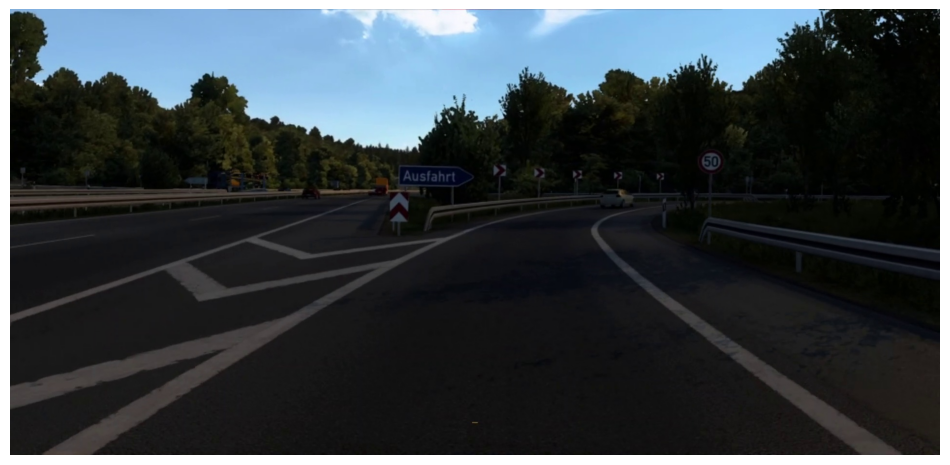

In [111]:
from PIL import ImageDraw, ImageFont
font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSans-Regular.ttf", size=24)

img = get_random_sample()

# use model.predict on specific device when having multiple gpus
results = model.predict(img, device='cuda:0', batch=1)

# Get results (assuming single image per call)
for result in results:
    xyxy = result.boxes.xyxy  # [x1, y1, x2, y2]
    names = [result.names[cls.item()] for cls in result.boxes.cls.int()]
    class_ids = result.boxes.cls.int()  # tensor of class indices (ints)
    confs = result.boxes.conf

    # Draw on the image using a single drawing context
    draw = ImageDraw.Draw(img)

    for i, box in enumerate(xyxy):
        x1, y1, x2, y2 = box.tolist()
        label = f"{names[i]} {confs[i]:.2f}"
        class_id = class_ids[i].item()

        print(f"Detected class ID: {class_id} with confident: {confs[i]:.2f}")

        # Draw rectangle and text
        draw.rectangle([x1, y1, x2, y2], outline="red", width=3)
        draw.text((x1, y1), label, fill="red", font=font)

# Display the image
plt.figure(figsize=(12, 10)) # bigger
plt.imshow(img)
plt.axis('off')
plt.show()

In [70]:
def get_random_sample_path():
    files = [f for f in os.listdir(data_path) if os.path.isfile(os.path.join(data_path, f))]
    
    # choose a random file
    if files:
        random_sample = random.choice(files)
    
    return os.path.join(data_path, random_sample)

In [77]:
import cv2
import matplotlib.pyplot as plt

# Load image
img = cv2.imread(get_random_sample_path())

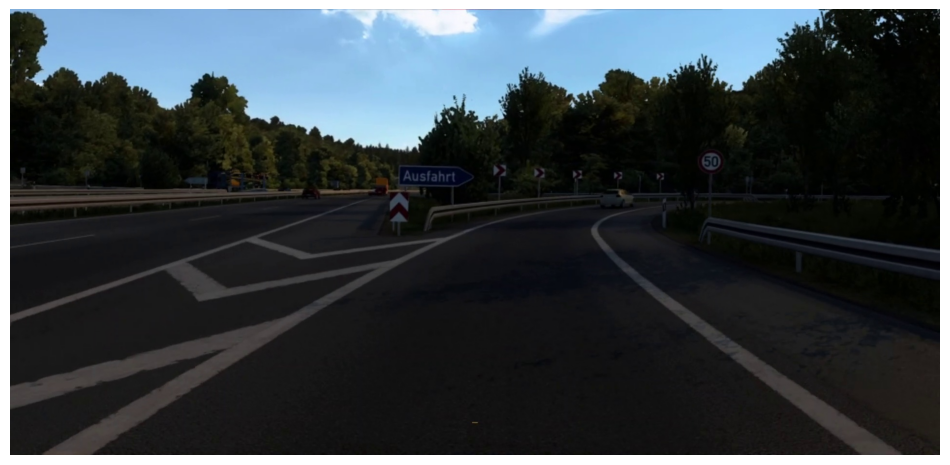

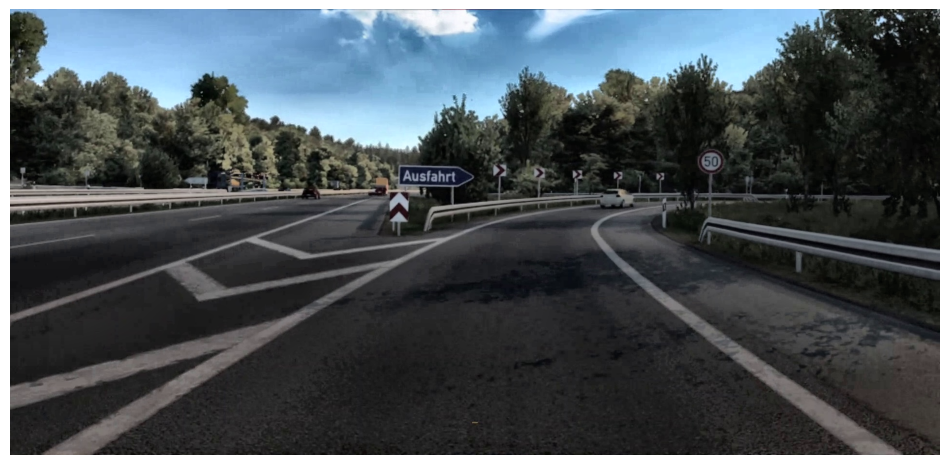

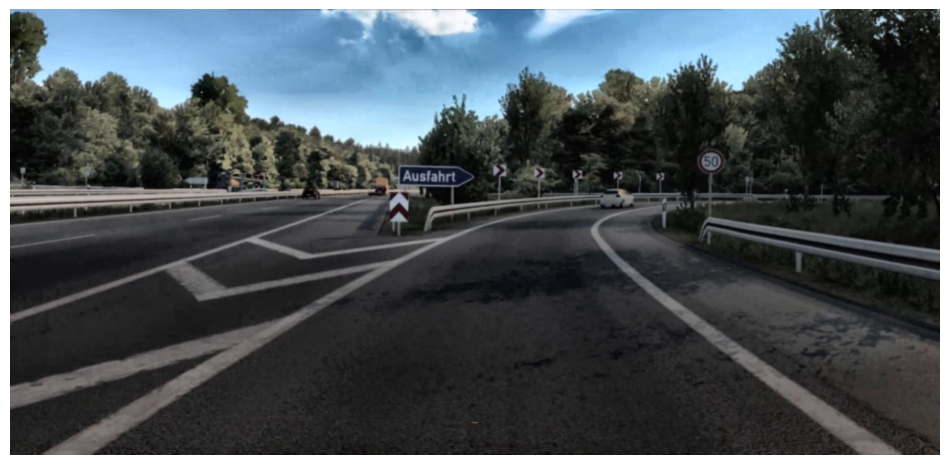

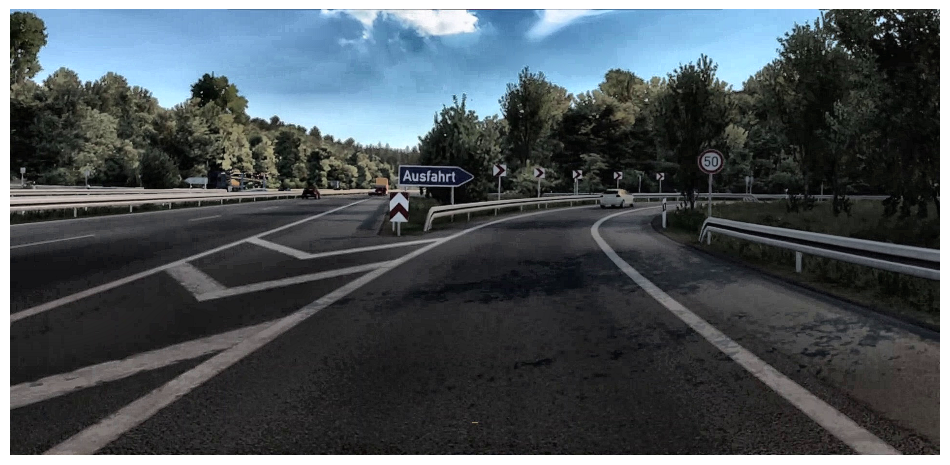

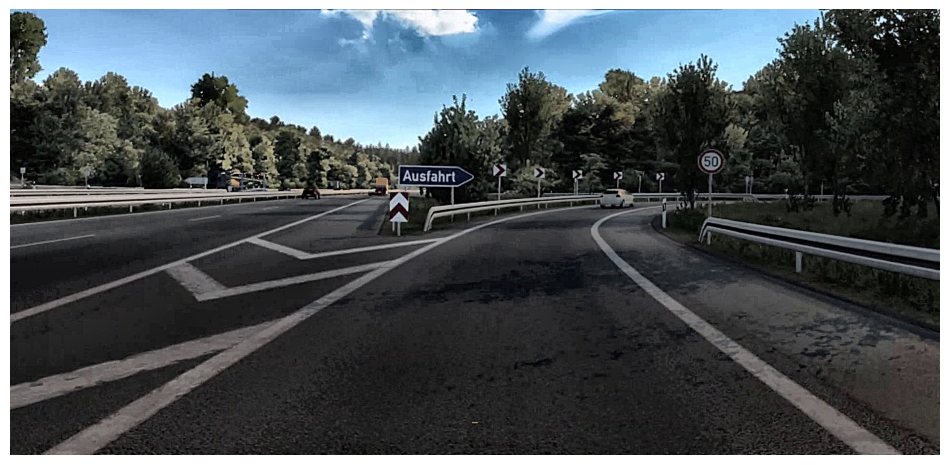

In [86]:
plt.figure(figsize=(12, 10)) # bigger
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

# Convert to YUV
img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)

# Apply CLAHE to the Y channel
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
img_yuv[:, :, 0] = clahe.apply(img_yuv[:, :, 0])

# Convert back to BGR
img_clahe = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

# Show image
plt.figure(figsize=(12, 10)) # bigger
plt.imshow(cv2.cvtColor(img_clahe, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

img_soft = cv2.GaussianBlur(img_clahe, (5, 5), sigmaX=1.0)
# Show image
plt.figure(figsize=(12, 10)) # bigger
plt.imshow(cv2.cvtColor(img_soft, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

# Sharpening kernel
sharpen_kernel = np.array([[0, -1,  0],
                           [-1,  5, -1],
                           [0, -1,  0]])
img_sharp = cv2.filter2D(img_clahe, -1, sharpen_kernel)

# Show result
plt.figure(figsize=(12, 10)) # bigger
plt.imshow(cv2.cvtColor(img_sharp, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

# Create a blurred version of the image
blurred = cv2.GaussianBlur(img_clahe, (0, 0), sigmaX=2)

# Unsharp mask: original + (original - blurred) * amount
amount = 1.5
img_unsharp = cv2.addWeighted(img_clahe, 1 + amount, blurred, -amount, 0)

# Show result
plt.figure(figsize=(12, 10)) # bigger
plt.imshow(cv2.cvtColor(img_unsharp, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()



0: 320x640 1 give way (other), 56.1ms
Speed: 2.3ms preprocess, 56.1ms inference, 1.9ms postprocess per image at shape (1, 3, 320, 640)
Detected class ID: 13 with confident: 0.70


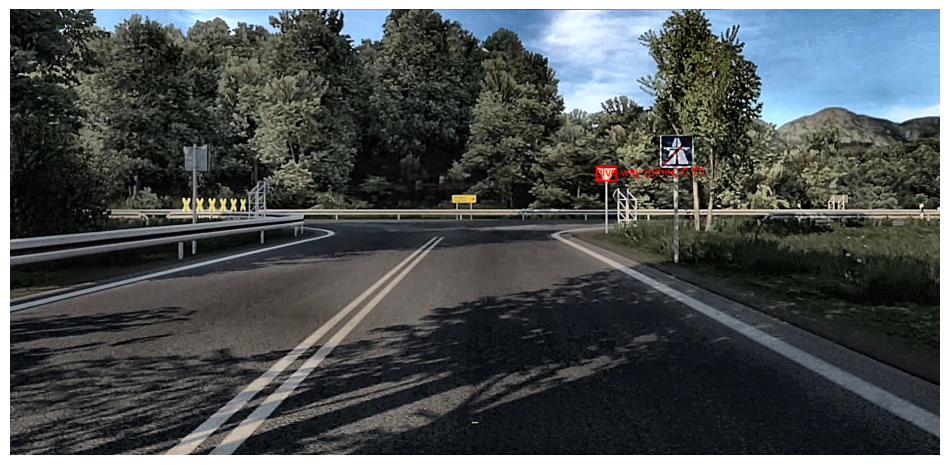

In [101]:
from PIL import ImageDraw, ImageFont
font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSans-Regular.ttf", size=24)

path = get_random_sample_path()
img = cv2.imread(path)

# Convert to YUV
img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)

# Apply CLAHE to the Y channel
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
img_yuv[:, :, 0] = clahe.apply(img_yuv[:, :, 0])

# Convert back to BGR
img_clahe = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

# Create a blurred version of the image
blurred = cv2.GaussianBlur(img_clahe, (0, 0), sigmaX=2)

# Unsharp mask: original + (original - blurred) * amount
amount = 1.5
img_unsharp = cv2.addWeighted(img_clahe, 1 + amount, blurred, -amount, 0)

img_rgb = cv2.cvtColor(img_unsharp, cv2.COLOR_BGR2RGB)
pil_image = Image.fromarray(img_rgb)

# use model.predict on specific device when having multiple gpus
results = model.predict(pil_image, device='cuda:0', batch=1)

# Get results (assuming single image per call)
for result in results:
    xyxy = result.boxes.xyxy  # [x1, y1, x2, y2]
    names = [result.names[cls.item()] for cls in result.boxes.cls.int()]
    class_ids = result.boxes.cls.int()  # tensor of class indices (ints)
    confs = result.boxes.conf

    # Draw on the image using a single drawing context
    draw = ImageDraw.Draw(pil_image)

    for i, box in enumerate(xyxy):
        x1, y1, x2, y2 = box.tolist()
        label = f"{names[i]} {confs[i]:.2f}"
        class_id = class_ids[i].item()

        print(f"Detected class ID: {class_id} with confident: {confs[i]:.2f}")

        # Draw rectangle and text
        draw.rectangle([x1, y1, x2, y2], outline="red", width=3)
        draw.text((x1, y1), label, fill="red", font=font)

# Display the image
plt.figure(figsize=(12, 10)) # bigger
plt.imshow(pil_image)
plt.axis('off')
plt.show()

In [118]:
def contrast_stretch(img):
    in_min = np.percentile(img, 2)
    in_max = np.percentile(img, 98)
    stretched = np.clip((img - in_min) * 255 / (in_max - in_min), 0, 255)
    return stretched.astype(np.uint8)



def gamma_correction(image, gamma=1.5):
    inv_gamma = 1.0 / gamma
    table = np.array([(i / 255.0) ** inv_gamma * 255
                      for i in range(256)]).astype("uint8")
    return cv2.LUT(image, table)




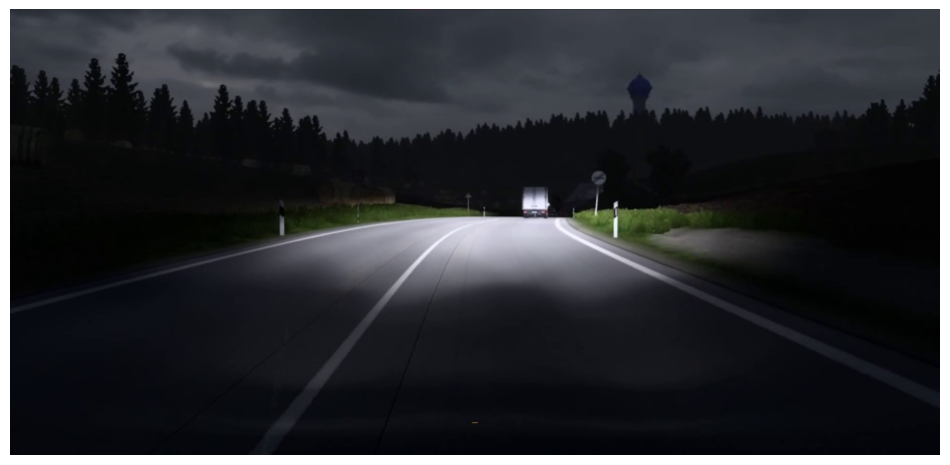

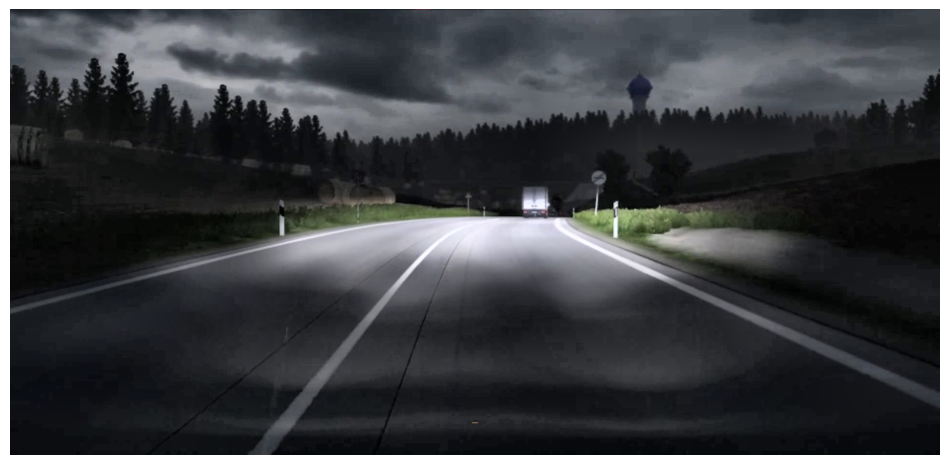

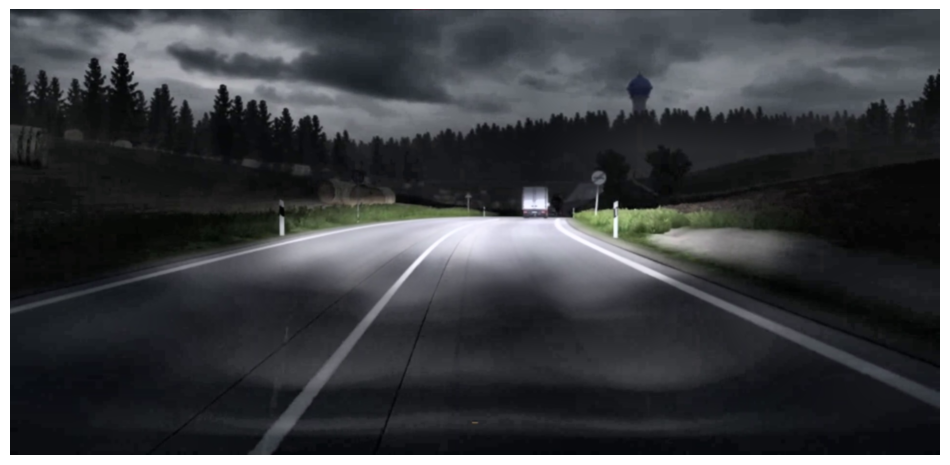

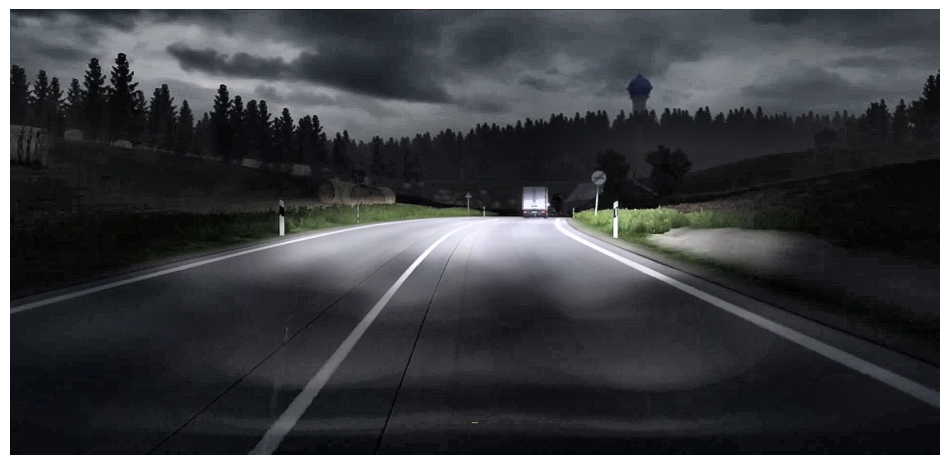

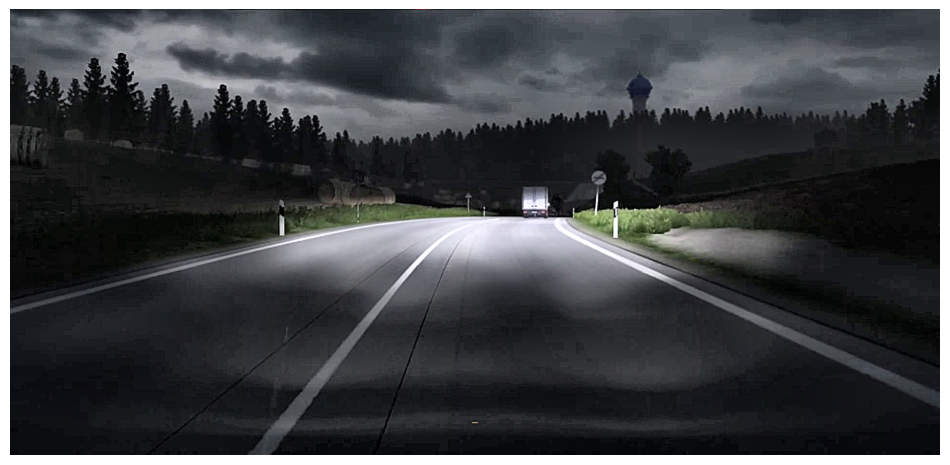

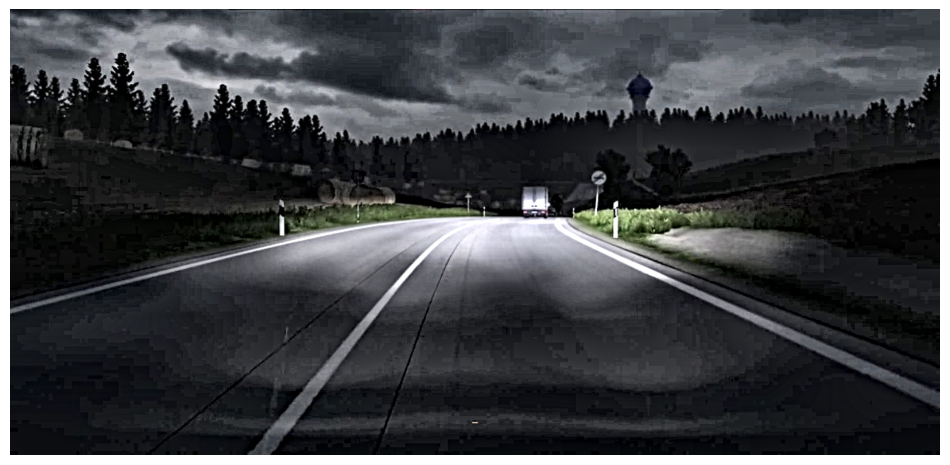

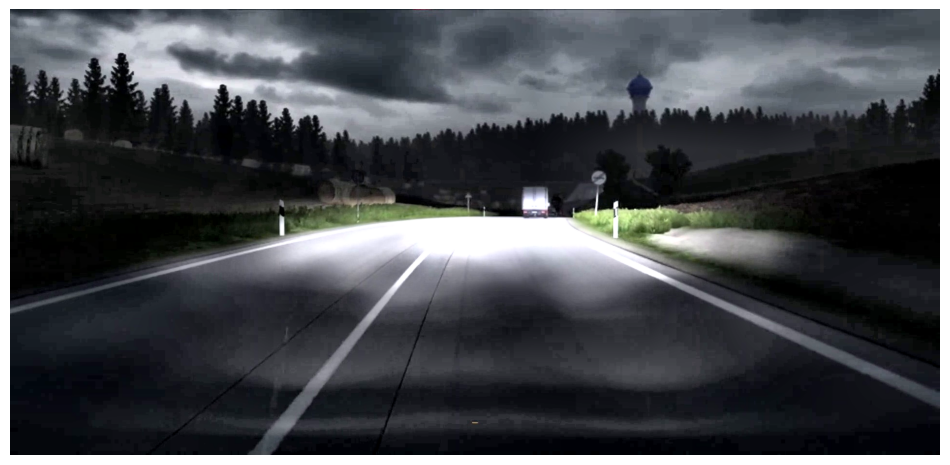

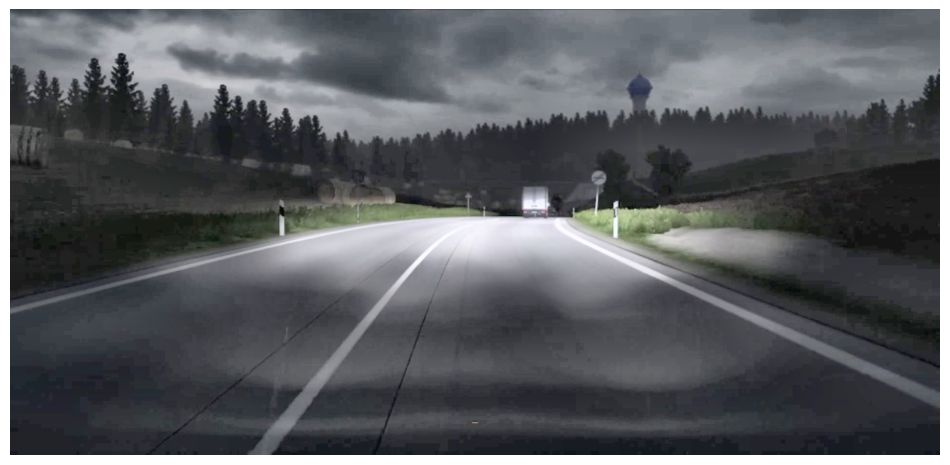

In [119]:
import cv2
import matplotlib.pyplot as plt

# Load image
img = cv2.imread(get_random_sample_path())

plt.figure(figsize=(12, 10)) # bigger
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

# Convert to YUV
img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)

# Apply CLAHE to the Y channel
clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
img_yuv[:, :, 0] = clahe.apply(img_yuv[:, :, 0])

# Convert back to BGR
img_clahe = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

# Show image
plt.figure(figsize=(12, 10)) # bigger
plt.imshow(cv2.cvtColor(img_clahe, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

img_soft = cv2.GaussianBlur(img_clahe, (5, 5), sigmaX=1.0)
# Show image
plt.figure(figsize=(12, 10)) # bigger
plt.imshow(cv2.cvtColor(img_soft, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

# Sharpening kernel
sharpen_kernel = np.array([[0, -1,  0],
                           [-1,  5, -1],
                           [0, -1,  0]])
img_sharp = cv2.filter2D(img_clahe, -1, sharpen_kernel)

# Show result
plt.figure(figsize=(12, 10)) # bigger
plt.imshow(cv2.cvtColor(img_sharp, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

# Create a blurred version of the image
blurred = cv2.GaussianBlur(img_clahe, (0, 0), sigmaX=2)

# Unsharp mask: original + (original - blurred) * amount
amount = 1.5
img_unsharp = cv2.addWeighted(img_clahe, 1 + amount, blurred, -amount, 0)

# Show result
plt.figure(figsize=(12, 10)) # bigger
plt.imshow(cv2.cvtColor(img_unsharp, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

enhanced = cv2.detailEnhance(img_clahe, sigma_s=10, sigma_r=0.15)
# Show result
plt.figure(figsize=(12, 10)) # bigger
plt.imshow(cv2.cvtColor(enhanced, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

stretched = contrast_stretch(img_clahe)
plt.figure(figsize=(12, 10)) # bigger
plt.imshow(cv2.cvtColor(stretched, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()

brightened = gamma_correction(img_clahe, gamma=1.5)
plt.figure(figsize=(12, 10)) # bigger
plt.imshow(cv2.cvtColor(brightened, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()


- CLAHE
- Unsharp Masking
- brightened
- detailEnhance

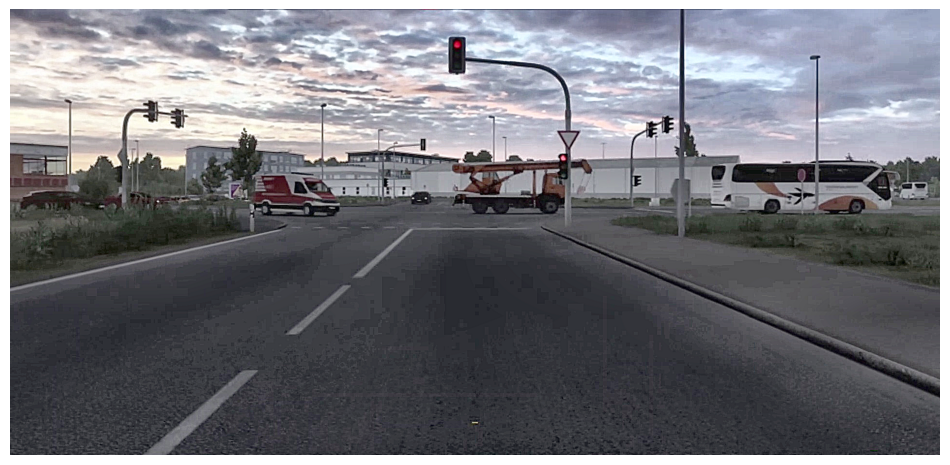

In [155]:
import cv2
import matplotlib.pyplot as plt

# Load image
img = cv2.imread(get_random_sample_path())

# Step 1: CLAHE
img_yuv = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
img_yuv[:, :, 0] = clahe.apply(img_yuv[:, :, 0])
img_clahe = cv2.cvtColor(img_yuv, cv2.COLOR_YUV2BGR)

# Step 2: Gamma Correction
def gamma_correction(image, gamma=1.5):
    inv_gamma = 1.0 / gamma
    table = np.array([(i / 255.0) ** inv_gamma * 255
                      for i in range(256)]).astype("uint8")
    return cv2.LUT(image, table)

img_bright = gamma_correction(img_clahe, gamma=1.5)

# Step 3: detailEnhance


# Step 4: Unsharp Masking
blurred = cv2.GaussianBlur(img_bright, (0, 0), sigmaX=2)
amount = 1.5
img_final = cv2.addWeighted(img_bright, 1 + amount, blurred, -amount, 0)

plt.figure(figsize=(12, 10)) # bigger
plt.imshow(cv2.cvtColor(img_final, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.show()
